In [1]:
from utils_somecor import *

In [10]:
isdebug = False
isplot = False
isplot_map = False

isbest_pareto = False
isbest_corr = False
isbest_combined_score = False
isbest_cost = True

#------------------------------------
# user I/O settings
#------------------------------------

# folder to find input files:
#      varfile  = PATH_INPUT_DIR + 'daily_surface_climatology_2007_2016.nc'
PATH_INPUT_DIR  = '../input/'

# parent folders to save data and figures
PATH_SAVE_DIR = '../output/SOM/'
#PATH_FIGS_DIR = '../figs/SOM/'
PATH_FIGS_DIR = '/root/projects/TP2SOM/figs/SOM/'

In [14]:
def pairwise_correlations(time_series_set):
    n = len(time_series_set)
    correlations = []
    for i in range(n):
        for j in range(i + 1, n):
            #corr = np.corrcoef(time_series_set[i], time_series_set[j])[0, 1]
            #correlations.append(corr)
            #corr = np.corrcoef(time_series_set[i], time_series_set[j])[0, 1] 
            #correlations.append(corr*corr)
            corr = np.corrcoef(time_series_set[i], time_series_set[j])[0, 1] + 1 # Based on Caglar's suggestion 
            correlations.append(corr*corr)
    return correlations

In [4]:
def plot_timeseries(ax,list_array,label,xlabel=None,ylabel=None,title=None,vmin=None,vmax=None):
    # Plot each array with a label
    for i, array in enumerate(list_array):
        ax.plot(array,label=label_id[i])
    #ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
    #ax.legend() # Add legend
    
    if vmin is not None and vmax is not None: # Set Y-axis limits
        ax.set_ylim(vmin, vmax)   
    if xlabel is not None:
        ax.set_xlabel(xlabel) # Add x label
    if xlabel is not None:
        ax.set_ylabel(ylabel) # Add y label
    if title is not None:
        ax.set_title(title) # Add title

In [5]:
#------------------------------------
# read hycom parameters
#------------------------------------

varfile = PATH_INPUT_DIR + 'daily_surface_climatology_2007_2016.nc'

with NetCDFHandler(varfile) as ncfile:
    
    chla_ma = (ncfile.variables['ECO_diac'][:].squeeze() +
               ncfile.variables['ECO_flac'][:].squeeze() +
               ncfile.variables['ECO_cclc'][:].squeeze())
    if isdebug:
        print(ncfile.variables.keys())
        inspect_array(chla_ma,False)

In [6]:
#------------------------------------
# SOM topology and regionalization threshold settings
#------------------------------------

#topology, percentile = "5x3", 90
topology, percentile = "5x3", 85
#topology, percentile = "5x3", 80
#topology, percentile = "4x3", 90
#topology, percentile = "4x3", 85
#topology, percentile = "4x3", 80

In [7]:
# number of trials

nt = 100

# subplot settings

jt = 4                  # number of columns
if nt == 1:             # number of rows
    it = 1
else:
    it = (nt + 1) // jt

../output/SOM/5x3/85/01/TP2_ecor.nc is loaded
../output/SOM/5x3/85/02/TP2_ecor.nc is loaded
../output/SOM/5x3/85/03/TP2_ecor.nc is loaded
../output/SOM/5x3/85/04/TP2_ecor.nc is loaded
../output/SOM/5x3/85/05/TP2_ecor.nc is loaded
../output/SOM/5x3/85/06/TP2_ecor.nc is loaded
../output/SOM/5x3/85/07/TP2_ecor.nc is loaded
../output/SOM/5x3/85/08/TP2_ecor.nc is loaded
../output/SOM/5x3/85/09/TP2_ecor.nc is loaded
../output/SOM/5x3/85/10/TP2_ecor.nc is loaded
../output/SOM/5x3/85/11/TP2_ecor.nc is loaded
../output/SOM/5x3/85/12/TP2_ecor.nc is loaded
../output/SOM/5x3/85/13/TP2_ecor.nc is loaded
../output/SOM/5x3/85/14/TP2_ecor.nc is loaded
../output/SOM/5x3/85/15/TP2_ecor.nc is loaded
../output/SOM/5x3/85/16/TP2_ecor.nc is loaded
../output/SOM/5x3/85/17/TP2_ecor.nc is loaded
../output/SOM/5x3/85/18/TP2_ecor.nc is loaded
../output/SOM/5x3/85/19/TP2_ecor.nc is loaded
../output/SOM/5x3/85/20/TP2_ecor.nc is loaded
../output/SOM/5x3/85/21/TP2_ecor.nc is loaded
../output/SOM/5x3/85/22/TP2_ecor.n

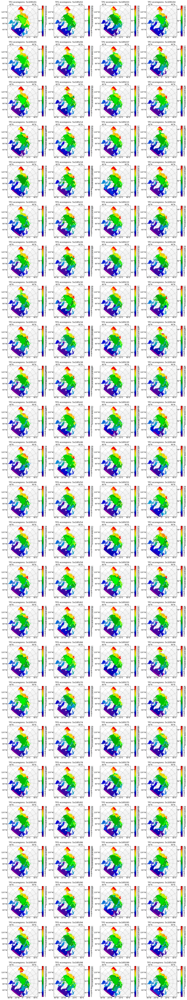

In [9]:
#------------------------------------
# plot ecoregions maps over trials
#------------------------------------
isplot_map = True
if isplot_map:
    fig, axes = plt.subplots(it, jt, figsize=(15,80))
    axes = np.atleast_1d(axes) # Ensure axes is always iterable
    
    for ax, i in zip(axes.flatten(), range(nt)):
        trial = f"{i+1:02}"
        if isdebug:
            print(f"{trial}")

        #------------------------------------
        # I/O settings
        #------------------------------------
        PATH_LOAD_DATA = f"{PATH_SAVE_DIR}{topology}/{percentile}/{trial}/"

        #--------------------------------------
        # Read SOM ecoregions from netCDF files
        #--------------------------------------
        # Read the NetCDF file                                                                                  
        ncfile_ecor = f"{PATH_LOAD_DATA}TP2_ecor.nc"

        with NetCDFHandler(ncfile_ecor) as ncfile:
            print(f"{ncfile_ecor} is loaded")
            if isdebug:
                print(ncfile.variables.keys())

            ecor = ncfile.variables['ecoregion'][:].squeeze()
            lats = ncfile.variables['latitude'][:].squeeze()
            lons = ncfile.variables['longitude'][:].squeeze()
            #print(type(ecor),ecor.shape)

        plot_ecoregion_TP2(ax,lons,lats,ecor,title=f"TP2 ecoregions: {topology}/{percentile}/{trial}")

    # Plot figure
    plt.tight_layout()
    
    # Save figure
    outfile=f"{PATH_FIGS_DIR}TP2_ecoregions_{topology}_{percentile}.png"
    plt.savefig(outfile,dpi=300)
    print(f"{outfile} is saved")

    plt.show()

../output/SOM/5x3/85/01/TP2_ecor.nc is loaded
../output/SOM/5x3/85/02/TP2_ecor.nc is loaded
../output/SOM/5x3/85/03/TP2_ecor.nc is loaded
../output/SOM/5x3/85/04/TP2_ecor.nc is loaded
../output/SOM/5x3/85/05/TP2_ecor.nc is loaded
../output/SOM/5x3/85/06/TP2_ecor.nc is loaded
../output/SOM/5x3/85/07/TP2_ecor.nc is loaded
../output/SOM/5x3/85/08/TP2_ecor.nc is loaded
../output/SOM/5x3/85/09/TP2_ecor.nc is loaded
../output/SOM/5x3/85/10/TP2_ecor.nc is loaded
../output/SOM/5x3/85/11/TP2_ecor.nc is loaded
../output/SOM/5x3/85/12/TP2_ecor.nc is loaded
../output/SOM/5x3/85/13/TP2_ecor.nc is loaded
../output/SOM/5x3/85/14/TP2_ecor.nc is loaded
../output/SOM/5x3/85/15/TP2_ecor.nc is loaded
../output/SOM/5x3/85/16/TP2_ecor.nc is loaded
../output/SOM/5x3/85/17/TP2_ecor.nc is loaded
../output/SOM/5x3/85/18/TP2_ecor.nc is loaded
../output/SOM/5x3/85/19/TP2_ecor.nc is loaded
../output/SOM/5x3/85/20/TP2_ecor.nc is loaded
../output/SOM/5x3/85/21/TP2_ecor.nc is loaded
../output/SOM/5x3/85/22/TP2_ecor.n

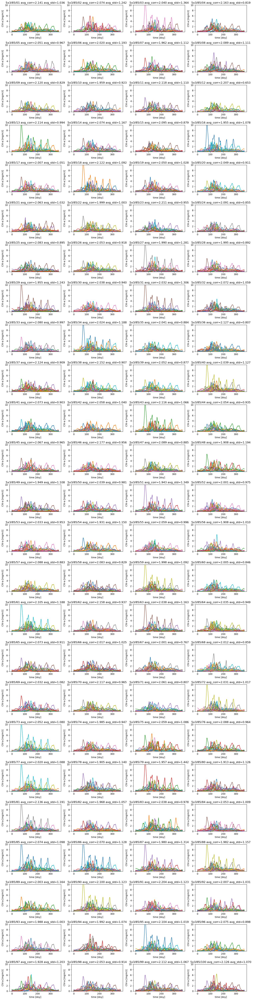

In [8]:
#------------------------------------
# create list of indicators
#------------------------------------
fig, axes = plt.subplots(it, jt, figsize=(15,60))
axes = np.atleast_1d(axes) # Ensure axes is always iterable

list_avg_corr = []
list_avg_std = []

for ax, i in zip(axes.flatten(), range(nt)):
    trial = f"{i+1:02}"
    if isdebug:
        print(f"{trial}")

    #------------------------------------
    # I/O settings
    #------------------------------------

    PATH_LOAD_DATA = f"{PATH_SAVE_DIR}{topology}/{percentile}/{trial}/"

    #--------------------------------------
    # Read SOM ecoregions from netCDF files
    #--------------------------------------

    # Read the NetCDF file                                                                                  
    ncfile_ecor = f"{PATH_LOAD_DATA}TP2_ecor.nc"

    with NetCDFHandler(ncfile_ecor) as ncfile:
        print(f"{ncfile_ecor} is loaded")
        if isdebug:
            print(ncfile.variables.keys())

        ecor = ncfile.variables['ecoregion'][:].squeeze()
        #print(type(ecor),ecor.shape)

    # List of ecoregion ID

    ecor_id = np.unique(ecor.compressed())
    ecor_id = ecor_id.astype(int)
    label_id = ecor_id.astype(str)
    #print(ecor_id)
    #print(label_id)

    list_chla_mean = []
    list_chla_std = [] 
    for idx, id in enumerate(ecor_id):
        indices = np.where(ecor == id)
        averages = np.array([
                      np.mean(chla_ma[i, indices[0], indices[1]])  # Compute mean at each slice
                      for i in range(chla_ma.shape[0])
                   ])
        stds = np.array([
                  np.std(chla_ma[i, indices[0], indices[1]])  # Compute standard deviation at each slice
                  for i in range(chla_ma.shape[0])
               ])
        list_chla_mean.append(averages)
        #list_chla_std.append(stds)
        list_chla_std.append(stds*stds)
        
    # Sum of pairwise correlations
    corr = pairwise_correlations(list_chla_mean)
    avg_corr = np.mean(corr)

    # Sum of standard deviations
    std = np.concatenate(list_chla_std)
    avg_std = np.mean(std)
    
    list_avg_corr.append(avg_corr)
    list_avg_std.append(avg_std)

    #print(type(list_chla_mean),len(list_chla_mean),type(list_chla_mean[0]),list_chla_mean[0].shape)

    #---------------------------------------------
    # plot mean chl-a time series over trials
    #---------------------------------------------
    title = f"{topology}/{percentile}/{trial} avg_corr={avg_corr:.3f} avg_std={avg_std:.3f}"
    plot_timeseries(ax,list_chla_mean,label_id,xlabel=f"time [doy]",ylabel=f"Chl-a [mg/m3]",
                        title=title,vmin=0.0,vmax=10.0)

plt.tight_layout()
    
# Save figure
outfile=f"{PATH_FIGS_DIR}chla_mean_{topology}_{percentile}.png"
plt.savefig(outfile,dpi=300)
print(f"{outfile} is saved")

plt.show()

In [22]:
if isbest_pareto:
    #------------------------------------
    # Detect the best trial that has the smallest value in avg_corr and avg_std (Pareto front)
    #------------------------------------
    avg_corr = np.array(list_avg_corr)
    avg_std = np.array(list_avg_std)
    min_indices = np.lexsort((avg_corr, avg_std)) 
    best_index = min_indices[0]  # Smallest in both properties

In [23]:
if isbest_corr:
    #------------------------------------
    # Detect the best trial that has the smallest mean pairwise correlation.
    #------------------------------------
    # Sort the list in ascending order while keeping track of indices
    sorted_indices = sorted(range(len(list_avg_corr)), key=lambda i: list_avg_corr[i])
    best_index = sorted_indices[0] # Smallest in correlation

In [24]:
if isbest_combined_score:
    #------------------------------------
    # Detect the best trial that has the smallest value in avg_corr and avg_std (Combined Score)
    #------------------------------------
    avg_corr = np.array(list_avg_corr)
    avg_std = np.array(list_avg_std)
    combined_scores = [p1 + p2 for p1, p2 in zip(avg_corr, avg_std)]
    best_index = combined_scores.index(min(combined_scores))
    best_score = combined_scores[best_index]

In [11]:
if isbest_cost:
    #------------------------------------
    # Find the Set with the Smallest Euclidean Distance to (0,0)
    #------------------------------------
    avg_corr = np.array(list_avg_corr)
    avg_std = np.array(list_avg_std)
    # Normalize using mean and standard deviation (Z-score normalization)
    std_norm = (avg_std - np.mean(avg_std)) / np.std(avg_std)    
    corr_norm = (avg_corr - np.mean(avg_corr)) / np.std(avg_corr)
    # Compute Euclidean distance from (0,0) using normalized values
    pad_std = 3 
    pad_corr = 3 
    distance = np.sqrt((std_norm+pad_std)**2 + (corr_norm+pad_corr)**2)
    # Find the index of the minimum distance
    best_index = np.argmin(distance)
    best_score = avg_corr[best_index] + avg_std[best_index]

/root/projects/TP2SOM/figs/SOM/optimal_trial_5x3_85_best_norm.png is saved


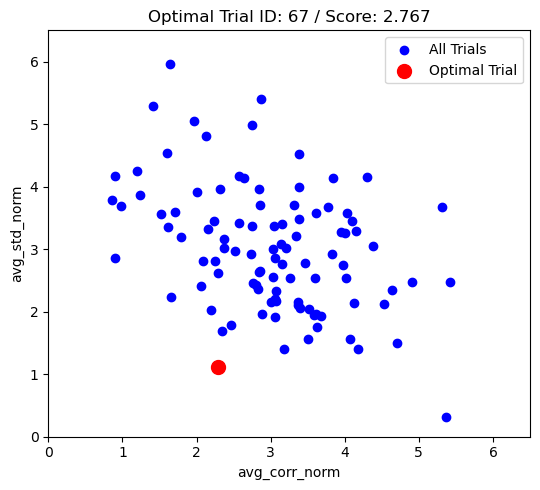

In [12]:
# Visualize the data
plt.figure(figsize=(5.5,5))
plt.scatter(corr_norm+pad_corr, std_norm+pad_std, color='blue', label='All Trials')

# Highlight the Pareto front
plt.scatter(corr_norm[best_index]+pad_corr, std_norm[best_index]+pad_std, color='red', label=f"Optimal Trial", s=100)

# Set axis ranges
plt.xlim(0.0, 6.5)  # Set range for x-axis
plt.ylim(0.0, 6.5)  # Set range for y-axis

# Add labels and legend
plt.xlabel('avg_corr_norm')
plt.ylabel('avg_std_norm')

plt.title(f"Optimal Trial ID: {best_index+1} / Score: {best_score:.3f}")
plt.legend()
#plt.grid()
plt.tight_layout()
outfile=f"{PATH_FIGS_DIR}optimal_trial_{topology}_{percentile}_best_norm.png"
plt.savefig(outfile,dpi=300)
print(f"{outfile} is saved")
plt.show()

/root/projects/TP2SOM/figs/SOM/optimal_trial_5x3_85_best.png is saved


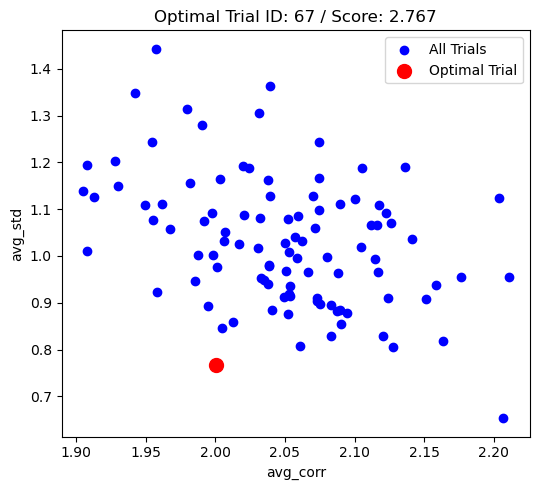

In [13]:
# Visualize the data
plt.figure(figsize=(5.5,5))
plt.scatter(avg_corr, avg_std, color='blue', label='All Trials')

# Highlight the Pareto front
plt.scatter(avg_corr[best_index], avg_std[best_index], color='red', label=f"Optimal Trial", s=100)

# Set axis ranges
#plt.xlim(0.30, 0.55)  # Set range for x-axis
#plt.ylim(0.40, 0.75)  # Set range for y-axis

# Add labels and legend
plt.xlabel('avg_corr')
plt.ylabel('avg_std')

plt.title(f"Optimal Trial ID: {best_index+1} / Score: {best_score:.3f}")
plt.legend()
#plt.grid()
plt.tight_layout()
outfile=f"{PATH_FIGS_DIR}optimal_trial_{topology}_{percentile}_best.png"
plt.savefig(outfile,dpi=300)
print(f"{outfile} is saved")
plt.show()

Best trial is 67
../output/SOM/5x3/85/67/TP2_ecor.nc is loaded
/root/projects/TP2SOM/figs/SOM/ecor_5x3_85_best.png is saved


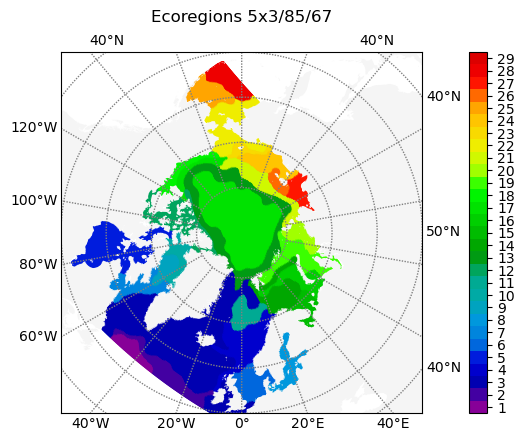

/root/projects/TP2SOM/figs/SOM/chla_mean_5x3_85_best.png is saved


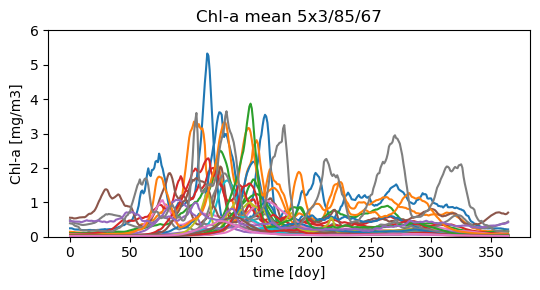

In [88]:
#------------------------------------
# plot best trial case
#------------------------------------

trial = f"{best_index+1:02}"
#trial = f"{sorted_indices[0]+1:02}"

print(f"Best trial is {trial}")

PATH_LOAD_DATA = f"{PATH_SAVE_DIR}{topology}/{percentile}/{trial}/"

#--------------------------------------
# Read SOM ecoregions from netCDF files
#--------------------------------------

# Read the NetCDF file                                                                                  
ncfile_ecor = f"{PATH_LOAD_DATA}TP2_ecor.nc"

with NetCDFHandler(ncfile_ecor) as ncfile:
    print(f"{ncfile_ecor} is loaded")
    if isdebug:
        print(ncfile.variables.keys())

    ecor = ncfile.variables['ecoregion'][:].squeeze()
    lats = ncfile.variables['latitude'][:].squeeze()
    lons = ncfile.variables['longitude'][:].squeeze()

    # List of ecoregion ID

    ecor_id = np.unique(ecor.compressed())
    ecor_id = ecor_id.astype(int)
    label_id = ecor_id.astype(str)

    list_chla_mean = []
    for idx, id in enumerate(ecor_id):
        indices = np.where(ecor == id)
        averages = np.array([
                      np.mean(chla_ma[i, indices[0], indices[1]])  # Extract and compute mean for each slice
                      for i in range(chla_ma.shape[0])
                   ])
        list_chla_mean.append(averages)
    
title = f"{topology}/{percentile}/{trial}"

fig, ax = plt.subplots(1, 1, figsize=(8,4.5))
plot_ecoregion_TP2(ax,lons,lats,ecor,title=f"Ecoregions {title}")
plt.tight_layout()
outfile=f"{PATH_FIGS_DIR}ecor_{topology}_{percentile}_best.png"
plt.savefig(outfile,dpi=300)
print(f"{outfile} is saved")
plt.show()

isplot = True
if isplot:
    fig, ax = plt.subplots(1, 1, figsize=(5.5,3))
    plot_timeseries(ax,list_chla_mean,label_id,xlabel=f"time [doy]",ylabel=f"Chl-a [mg/m3]",title=f"Chl-a mean {title}",vmin=0.0,vmax=6.0)
    plt.tight_layout()
    outfile=f"{PATH_FIGS_DIR}chla_mean_{topology}_{percentile}_best.png"
    plt.savefig(outfile,dpi=300)
    print(f"{outfile} is saved")
    plt.show()